<a href="https://colab.research.google.com/github/kevincogan/Binary_Tree_Haskell/blob/main/CA683_Project_Group1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CA683 Project Group 1: Stock Market Price Prediction
Authors: [Kevin Cogan](mailto:kevin.cogan3@mail.dcu.ie), [Paul Duhamel-Sebline](mailto:paul.duhamelsebline2@mail.dcu.ie), [Christof Kälin](mailto:christof.kalin2@mail.dcu.ie) and [Gonzalo López Gil](mailto:gonzalo.lopezgil2@mail.dcu.ie)


### Idea & Goal

Since Paul and Gonzalo are doing their [practicum](https://gitlab.computing.dcu.ie/lopezgg2/2024-mcm-lopezgg2-duhamep2) together on the prediction of stock market price trends, we decided to go with this topic.

Therefore, we went with a dataset found on Kaggle that has historical data about stocks from January 2000 until today: https://www.kaggle.com/datasets/nelgiriyewithana/world-stock-prices-daily-updating

Following this, the research question was formulated: _Which machine learning models, trained on daily measured time series data of the S&P 500 index fund over the past two decades, achieve the highest returns by accurately forecasting future prices?_

### Imports

In [ ]:
# Import all necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime

sns.set(style='darkgrid')

import requests
from bs4 import BeautifulSoup

import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from keras.models import Sequential, load_model
from keras.layers import SimpleRNN, Dropout, Dense, LSTM
from keras.optimizers import SGD, Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard

!pip install pmdarima
import pmdarima as pm

!pip install ta
import ta
from scipy.signal import argrelextrema

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29411 sha256=f8ec1ca5812d542c6f85d38ec60b90cfcfc5b1589782cef02144860b0761004f
  Stored in directory: /root/.cache/pip/wheels/5f/67/4f/8a9f252836e053e532c6587a3230bc72a4deb16b03a829610b
Successfully built ta


### Loading the data

In [ ]:
# Download the dataset to the Colab environment
!wget https://student.computing.dcu.ie/~kalinc2/ca683/World-Stock-Prices-Dataset.csv

--2024-04-11 15:35:42--  https://student.computing.dcu.ie/~kalinc2/ca683/World-Stock-Prices-Dataset.csv
Resolving student.computing.dcu.ie (student.computing.dcu.ie)... 136.206.218.15
Connecting to student.computing.dcu.ie (student.computing.dcu.ie)|136.206.218.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 41042247 (39M) [text/csv]
Saving to: ‘World-Stock-Prices-Dataset.csv’

World-Stock-Prices- 100%[===================>]  39.14M  12.5MB/s    in 3.1s    

2024-04-11 15:35:47 (12.5 MB/s) - ‘World-Stock-Prices-Dataset.csv’ saved [41042247/41042247]



In [ ]:
#Read the CSV file
df = pd.read_csv('World-Stock-Prices-Dataset.csv')

## Pre-Processing & EDA


### Data Pre-Processing

**Analyse Missing Values**

In [ ]:
# Analyzing missing values
def analyze_missing_values(dataframe):
    # Count total missing and sort it
    total = dataframe.isnull().sum().sort_values(ascending=False)

    # Calculate percentage
    percent = (dataframe.isnull().sum() / dataframe.isnull().count() * 100).sort_values(ascending=False)

    # Concatenate total and percent into a DataFrame
    missing_data = pd.concat([total, percent], axis=1, keys=['Total Missing', 'Percent'])

    # Exclude columns that do not have any missing values
    missing_data = missing_data[missing_data['Total Missing'] > 0]

    return missing_data

# Get the missing values data
missing_values_data = analyze_missing_values(df)

print(missing_values_data)

Empty DataFrame
Columns: [Total Missing, Percent]
Index: []


**Parsing Dates**

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

**Numerical Correction**

In [ ]:
numerical_columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits']
for col in numerical_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

**Handle Missing Data**

In [ ]:
df.dropna(inplace=True)

**Standardising Text**

In [ ]:
text_columns = ['Brand_Name', 'Ticker', 'Industry_Tag', 'Country']
for col in text_columns:
    df[col] = df[col].str.lower()

**Remove Whitespaces**

In [ ]:
text_columns = ['Brand_Name', 'Ticker', 'Industry_Tag', 'Country']
for col in text_columns:
    df[col] = df[col].str.strip()

### Exploratory Data Analysis

In [ ]:
# Summary statistics for numerical columns
summary_statistics = df.describe()

# Count of unique values in categorical columns
unique_brands = df['Brand_Name'].nunique()
unique_tickers = df['Ticker'].nunique()
unique_industries = df['Industry_Tag'].nunique()
unique_countries = df['Country'].nunique()

# Convert dates to datetime for any time series analysis
df['Date'] = pd.to_datetime(df['Date'], utc=True)

# Earliest and latest date in the dataset to understand the time range
earliest_date = df['Date'].min()
latest_date = df['Date'].max()

summary_statistics, unique_brands, unique_tickers, unique_industries, unique_countries, earliest_date, latest_date

(                Open           High            Low          Close  \
 count  279753.000000  279753.000000  279753.000000  279753.000000   
 mean       65.162445      65.914283      64.389596      65.167955   
 std       117.203158     118.573147     115.772027     117.190963   
 min         0.196890       0.199922       0.192798       0.198861   
 25%        15.049936      15.253301      14.837500      15.050000   
 50%        32.329837      32.712338      31.923977      32.330002   
 75%        72.318681      72.980003      71.635438      72.348923   
 max      2165.010010    2175.010010    2138.050049    2153.199951   
 
              Volume      Dividends   Stock Splits  
 count  2.797530e+05  279753.000000  279753.000000  
 mean   2.349103e+07       0.003406       0.000751  
 std    8.864361e+07       0.062041       0.073979  
 min    0.000000e+00       0.000000       0.000000  
 25%    1.350600e+06       0.000000       0.000000  
 50%    4.630800e+06       0.000000       0.000000

### Graph Analysis

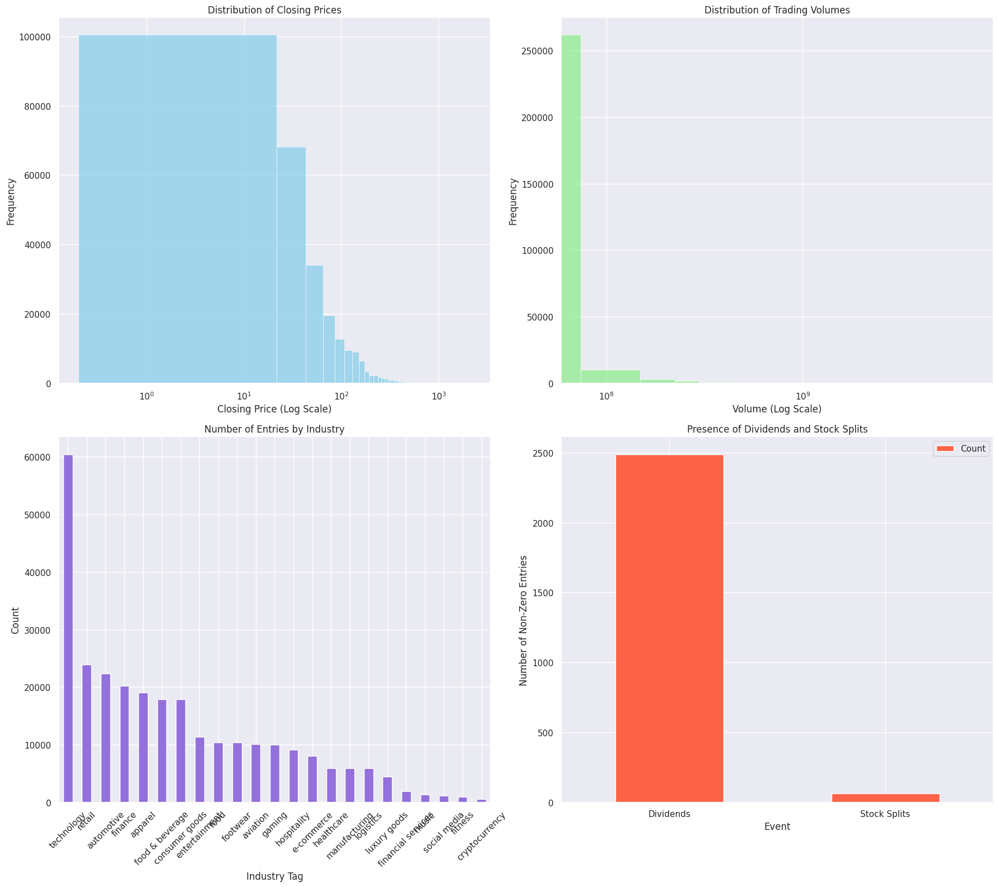

In [ ]:
# Preparing data for plotting
# Distribution of Closing Prices
closing_prices = df['Close']

# Distribution of Volumes
volumes = df['Volume']

# Dividends and Stock Splits
dividends = df['Dividends']
stock_splits = df['Stock Splits']

# Industry representation
industry_counts = df['Industry_Tag'].value_counts()

# Plotting
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Distribution of Closing Prices
sns.histplot(closing_prices, bins=100, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Distribution of Closing Prices')
axes[0, 0].set_xscale('log')
axes[0, 0].set_xlabel('Closing Price (Log Scale)')
axes[0, 0].set_ylabel('Frequency')

# Distribution of Volumes
sns.histplot(volumes, bins=100, ax=axes[0, 1], color='lightgreen')
axes[0, 1].set_title('Distribution of Trading Volumes')
axes[0, 1].set_xscale('log')
axes[0, 1].set_xlabel('Volume (Log Scale)')
axes[0, 1].set_ylabel('Frequency')

# Industry Representation
industry_counts.plot(kind='bar', ax=axes[1, 0], color='mediumpurple')
axes[1, 0].set_title('Number of Entries by Industry')
axes[1, 0].set_xlabel('Industry Tag')
axes[1, 0].set_ylabel('Count')
axes[1, 0].tick_params(axis='x', rotation=45)

# Dividends and Stock Splits Presence
dividends_non_zero = dividends[dividends > 0].count()
stock_splits_non_zero = stock_splits[stock_splits > 0].count()
presence_data = {'Event': ['Dividends', 'Stock Splits'], 'Count': [dividends_non_zero, stock_splits_non_zero]}

presence_df = pd.DataFrame(presence_data)
presence_df.plot(kind='bar', x='Event', y='Count', ax=axes[1, 1], color='tomato')
axes[1, 1].set_title('Presence of Dividends and Stock Splits')
axes[1, 1].set_ylabel('Number of Non-Zero Entries')
axes[1, 1].tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.show()

1. Distribution of Closing Prices: This histogram shows the frequency distribution of closing prices on a logarithmic scale, highlighting the wide range of stock prices in the dataset. The log scale helps to better visualize the distribution across a broad range of values.

2. Distribution of Trading Volumes: Similar to the closing prices, this histogram uses a logarithmic scale to display the trading volumes, illustrating the varied trading activity across different stocks. The log scale is crucial for managing the wide disparity in volumes.

3. Number of Entries by Industry: The bar chart presents the count of dataset entries categorized by industry, showcasing which sectors are more prevalent. This visualization helps identify the industries with the highest representation in the dataset.

4. Presence of Dividends and Stock Splits: This bar chart shows the number of non-zero entries for dividends and stock splits, offering insight into how often these events occur within the dataset. It highlights the relative rarity of dividends and stock splits compared to the total number of entries.

**Effect of COVID on the Stock Market**

In [ ]:
# Filtering the dataset for pre-COVID and post-COVID periods

pre_covid_end_date = pd.to_datetime('2020-03-01', utc=True)


pre_covid_df = df[df['Date'] < pre_covid_end_date]
post_covid_df = df[df['Date'] >= pre_covid_end_date]


# Aggregating data for each industry for pre-COVID and post-COVID periods
pre_covid_agg = pre_covid_df.groupby('Industry_Tag').agg({
    'Close': 'mean',
    'Volume': 'mean'
}).reset_index().rename(columns={'Close': 'Pre-COVID Avg Close', 'Volume': 'Pre-COVID Avg Volume'})

post_covid_agg = post_covid_df.groupby('Industry_Tag').agg({
    'Close': 'mean',
    'Volume': 'mean'
}).reset_index().rename(columns={'Close': 'Post-COVID Avg Close', 'Volume': 'Post-COVID Avg Volume'})

# Merging the pre-COVID and post-COVID aggregated data for comparison
covid_impact = pd.merge(pre_covid_agg, post_covid_agg, on='Industry_Tag')

# Calculating the percentage change in average close price and volume
covid_impact['% Change in Avg Close'] = ((covid_impact['Post-COVID Avg Close'] - covid_impact['Pre-COVID Avg Close']) / covid_impact['Pre-COVID Avg Close']) * 100
covid_impact['% Change in Avg Volume'] = ((covid_impact['Post-COVID Avg Volume'] - covid_impact['Pre-COVID Avg Volume']) / covid_impact['Pre-COVID Avg Volume']) * 100

# Sorting by percentage change in average close price for visualization
covid_impact_sorted = covid_impact.sort_values(by='% Change in Avg Close', ascending=False)

covid_impact_sorted

,Industry_Tag,Pre-COVID Avg Close,Pre-COVID Avg Volume,Post-COVID Avg Close,Post-COVID Avg Volume,% Change in Avg Close,% Change in Avg Volume
4,e-commerce,17.652308,1.085048e+08,110.784646,4.908077e+07,527.592973,-54.766290
21,technology,27.361623,8.041658e+07,146.008830,2.700934e+07,433.626355,-66.413215
9,food,176.798153,3.833901e+06,865.779306,1.681578e+06,389.699293,-56.139237
5,entertainment,59.393701,1.325956e+07,275.996837,9.944299e+06,364.690419,-25.002823
16,luxury goods,30.389511,8.772549e+04,134.764982,1.690802e+05,343.458874,92.737808
19,retail,51.801582,5.442443e+06,228.962307,4.258884e+06,341.998675,-21.746824
12,gaming,5.923236,7.616899e+05,22.954044,5.083457e+06,287.525365,567.391915
6,finance,54.831941,1.439898e+07,205.352646,7.601189e+06,274.512816,-47.210215
10,food & beverage,32.509878,1.027200e+07,110.617382,8.208524e+06,240.257758,-20.088385
7,financial services,42.163135,9.038891e+06,134.281793,1.271486e+07,218.481520,40.668351


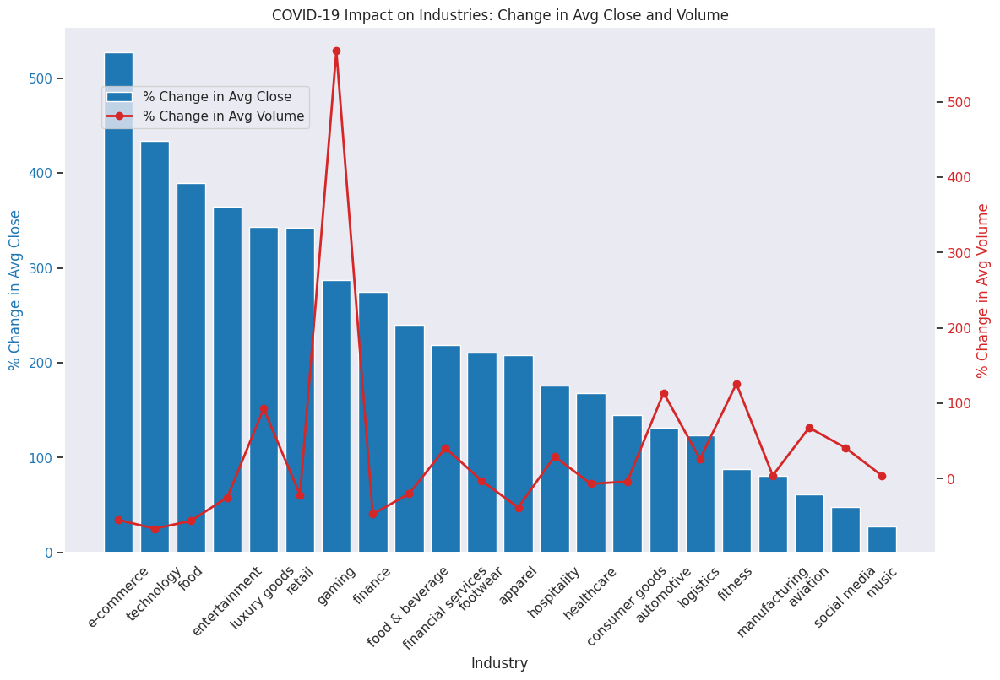

In [ ]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:blue'
ax1.set_xlabel('Industry')
ax1.set_ylabel('% Change in Avg Close', color=color)
ax1.bar(covid_impact_sorted['Industry_Tag'], covid_impact_sorted['% Change in Avg Close'], color=color, label='% Change in Avg Close')
ax1.tick_params(axis='y', labelcolor=color)
ax1.tick_params(axis='x', rotation=45)
ax1.grid(False)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('% Change in Avg Volume', color=color)
ax2.plot(covid_impact_sorted['Industry_Tag'], covid_impact_sorted['% Change in Avg Volume'], color=color, marker='o', label='% Change in Avg Volume', linewidth=2)
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(False)

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1,0.9))
plt.title('COVID-19 Impact on Industries: Change in Avg Close and Volume')
plt.show()

### Feature Engineering
As we learnt about feature engineering and enriching data current columns and web scraping, we decided to evaluate which companies are in the *current* S&P 500 index fund. The source used to scrape is Wikipedia.

In [ ]:
# Get a list of companies in the S&P 500 index
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')
table = soup.find('table', id='constituents')

company_names = []
for row in table.find_all('tr')[1:]:  # Skip header row
    cells = row.find_all('td')
    company_names.append(cells[0].text.strip().lower())

In [ ]:
# Add them to the dataframe
df['SP500'] = df['Ticker'].apply(lambda x: x in company_names)

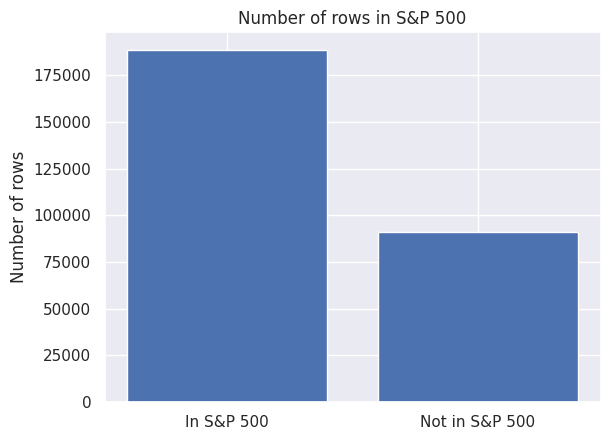

In [ ]:
# Plot bars
plt.bar(['In S&P 500', 'Not in S&P 500'], [df['SP500'].value_counts()[True], df['SP500'].value_counts()[False]], label='Count')

# Set labels and title
plt.ylabel('Number of rows')
plt.title('Number of rows in S&P 500')

# Show plot
plt.show()

## Time Series

Out of this index we are creating a time series by summing up the Close prices from each day.

In [ ]:
ts = df.loc[df['SP500'] ==True].groupby('Date')['Close'].sum().reset_index()

In [ ]:
cutoff_date = pd.Timestamp('2023-07-01', tz='UTC')
ts = ts[ts['Date'] < cutoff_date] # Drop after June 2023
print(f"Max. date: {ts['Date'].max()}")

Max. date: 2023-06-30 04:00:00+00:00


In [ ]:
# Split training and test data
splitting_date = pd.Timestamp('2022-01-01', tz='UTC')
ts_train = ts[ts['Date'] < splitting_date] # Training group until 2021
print(f"Max. date training: {ts_train['Date'].max()}")

Max. date training: 2021-12-31 05:00:00+00:00


In [ ]:
ts_test = ts[ts['Date'] >= splitting_date] # Test group from 2022
print(f"Min. date test: {ts_test['Date'].min()}")

Min. date test: 2022-01-03 05:00:00+00:00


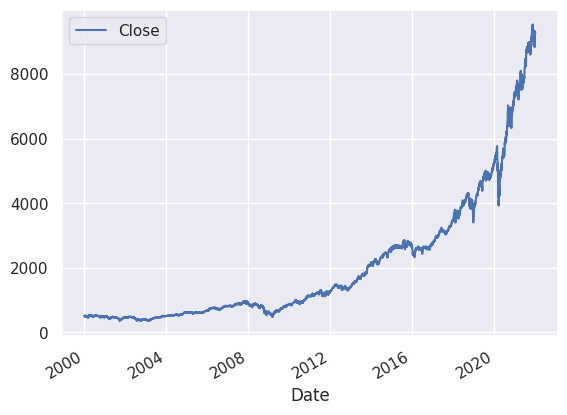

In [ ]:
ts_train.plot.line(x='Date', y='Close');

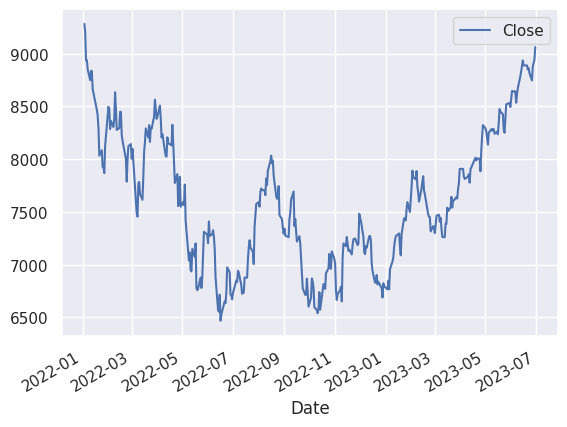

In [ ]:
ts_test.plot.line(x='Date', y='Close');

### Sequential Models

#### Normalization

In [ ]:
close_prices = ts['Close'].values.reshape(-1, 1)

In [ ]:
# Normalize the feature data
scaler = MinMaxScaler(feature_range=(0, 1))
close_prices_scaled = scaler.fit_transform(close_prices)

In [ ]:
# Function to create sequences from the data
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length - 1):
        seq = data[i:(i + sequence_length), 0]
        label = data[i + sequence_length, 0]
        X.append(seq)
        y.append(label)
    return np.array(X), np.array(y)

#### Splitting & reshaping

In [ ]:
index_splitting = ts[ts['Date'] > splitting_date].index[0]

In [ ]:
sequence_length = 50
X, y = create_sequences(close_prices_scaled, sequence_length)

X_train, X_test = X[:index_splitting], X[index_splitting:]
y_train, y_test = y[:index_splitting], y[index_splitting:]


X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

#### RNN model

⚠️ The following code is commented to avoid triggering accidental re-execution. The trained RNN model can be downloaded and loaded in the cells thereafter!

In [ ]:
"""
# Code from here: https://www.geeksforgeeks.org/time-series-forecasting-using-recurrent-neural-networks-rnn-in-tensorflow/

# Initliaze the RNN
rnn_regressor = Sequential()

# Add RNN layers and dropout regularization
rnn_regressor.add(SimpleRNN(units = 50,
                        activation = 'tanh',
                        return_sequences = True,
                        input_shape = (X_train.shape[1],1)))
rnn_regressor.add(Dropout(0.2))

rnn_regressor.add(SimpleRNN(units = 50,
                        activation = 'tanh',
                        return_sequences = True))

rnn_regressor.add(SimpleRNN(units = 50,
                        activation = 'tanh',
                        return_sequences = True))

rnn_regressor.add( SimpleRNN(units = 50))

# Add output layer
rnn_regressor.add(Dense(units = 1,activation='sigmoid'))

# Comple RNN
rnn_regressor.compile(optimizer = SGD(learning_rate=0.01,
                                  momentum=0.9,
                                  nesterov=True),
                  loss = 'mean_squared_error')

# Fit the model
rnn_regressor.fit(X_train, y_train, epochs = 20, batch_size = 2)
rnn_regressor.summary()

# Save trained model
rnn_regressor.save('rnn.keras')
"""

"\n# Code from here: https://www.geeksforgeeks.org/time-series-forecasting-using-recurrent-neural-networks-rnn-in-tensorflow/\n\n# Initliaze the RNN\nrnn_regressor = Sequential()\n\n# Add RNN layers and dropout regularization\nrnn_regressor.add(SimpleRNN(units = 50,\n                        activation = 'tanh',\n                        return_sequences = True,\n                        input_shape = (X_train.shape[1],1)))\nrnn_regressor.add(Dropout(0.2))\n\nrnn_regressor.add(SimpleRNN(units = 50,\n                        activation = 'tanh',\n                        return_sequences = True))\n\nrnn_regressor.add(SimpleRNN(units = 50,\n                        activation = 'tanh',\n                        return_sequences = True))\n\nrnn_regressor.add( SimpleRNN(units = 50))\n\n# Add output layer\nrnn_regressor.add(Dense(units = 1,activation='sigmoid'))\n\n# Comple RNN\nrnn_regressor.compile(optimizer = SGD(learning_rate=0.01,\n                                  momentum=0.9,\n            

##### RNN: Predictions

In [ ]:
# Download the trained model
!wget https://student.computing.dcu.ie/~kalinc2/ca683/rnn.keras

--2024-04-11 15:36:09--  https://student.computing.dcu.ie/~kalinc2/ca683/rnn.keras
Resolving student.computing.dcu.ie (student.computing.dcu.ie)... 136.206.218.15
Connecting to student.computing.dcu.ie (student.computing.dcu.ie)|136.206.218.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 185576 (181K)
Saving to: ‘rnn.keras’

rnn.keras           100%[===================>] 181.23K   423KB/s    in 0.4s    

2024-04-11 15:36:10 (423 KB/s) - ‘rnn.keras’ saved [185576/185576]



In [ ]:
rnn_regressor = load_model('rnn.keras')

11/11 [==============================] - 2s 27ms/step


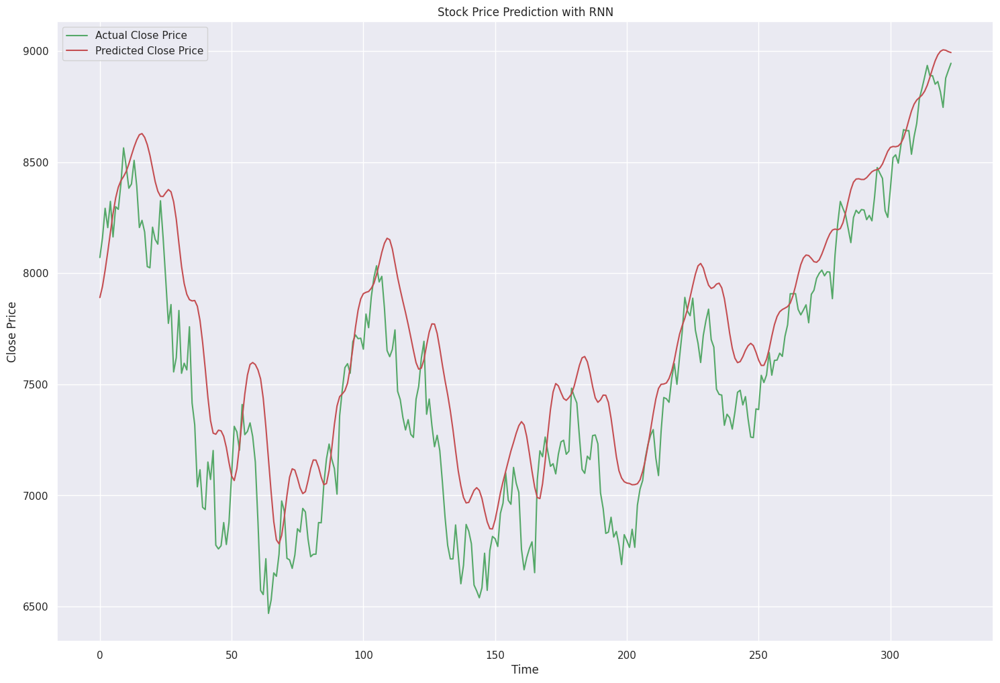

In [ ]:
# Make predictions on the test set
y_pred_scaled = rnn_regressor.predict(X_test)

# Inverse transform the predictions to get actual values
y_pred_rnn = scaler.inverse_transform(y_pred_scaled)

# Inverse transform to compare accurately
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Plotting
plt.figure(figsize=(18, 12))

# Plot actual close prices from the test set
plt.plot(y_test_actual, label='Actual Close Price', color='g')

# Plot predicted close prices
plt.plot(y_pred_rnn, label='Predicted Close Price', color='r')

plt.legend()
plt.title('Stock Price Prediction with RNN')
plt.xlabel('Time')
plt.ylabel('Close Price')

plt.show()

11/11 [==============================] - 0s 32ms/step


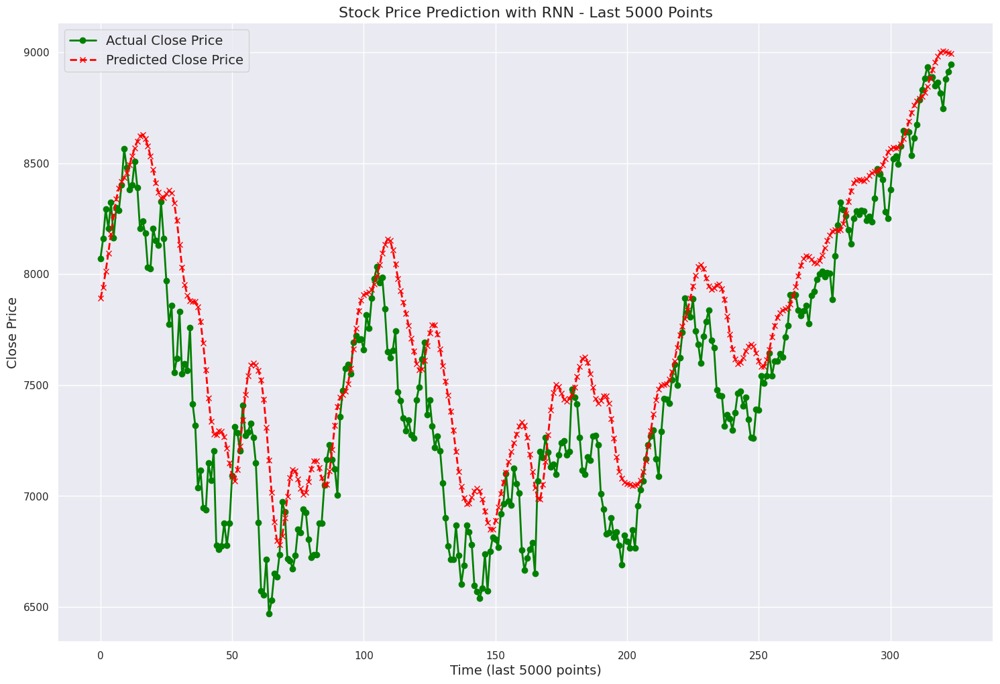

In [ ]:
# Make predictions on the test set
y_pred_scaled = rnn_regressor.predict(X_test)

# Inverse transform the predictions to get actual values
y_pred_rnn = scaler.inverse_transform(y_pred_scaled)

# Inverse transform the actual test set values
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Select a subset for a clearer view
subset_size = 5000
y_test_subset = y_test_actual[-subset_size:]
y_pred_subset = y_pred_rnn[-subset_size:]

# Plotting
plt.figure(figsize=(18, 12))

# Plot actual close prices
plt.plot(y_test_subset, marker='o', linestyle='-', linewidth=2, label='Actual Close Price', color='green')

# Plot predicted close prices
plt.plot(y_pred_subset, marker='x', linestyle='--', linewidth=2, label='Predicted Close Price', color='red')

plt.legend(fontsize=14)
plt.title(f'Stock Price Prediction with RNN - Last {subset_size} Points', fontsize=16)
plt.xlabel(f'Time (last {subset_size} points)', fontsize=14)
plt.ylabel('Close Price', fontsize=14)
plt.grid(True)

plt.show()

#### LSTM Model

In [ ]:
lstm_regressor = Sequential()
lstm_regressor.add(LSTM(units=50, activation='tanh', return_sequences=True, input_shape=(X_train.shape[1], 1)))
lstm_regressor.add(Dropout(0.2))
lstm_regressor.add(LSTM(units=50, activation='tanh', return_sequences=True))
lstm_regressor.add(Dropout(0.2))
lstm_regressor.add(LSTM(units=50, activation='tanh'))
lstm_regressor.add(Dropout(0.2))
lstm_regressor.add(Dense(units=1, activation='linear'))

lstm_regressor.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error', metrics=['mae'])

In [ ]:
# Callbacks for early stopping and saving checkpoints
checkpoint_filepath = 'lstm.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

early_stopping_callback = EarlyStopping(monitor='val_loss', patience=20)

In [ ]:
# TensorBoard Callback
%load_ext tensorboard
log_dir = os.path.join('logs', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

⚠️ The following code is commented to avoid triggering accidental re-execution. The trained LSTM model can be downloaded and loaded in the cells thereafter!

In [ ]:
"""
# Fit the model with callbacks
lstm_regressor.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, callbacks=[model_checkpoint_callback, early_stopping_callback, tensorboard_callback])

# Summary of the model
lstm_regressor.summary()
"""

'\n# Fit the model with callbacks\nlstm_regressor.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, callbacks=[model_checkpoint_callback, early_stopping_callback, tensorboard_callback])\n\n# Summary of the model\nlstm_regressor.summary()\n'

##### LSTM: Predictions

In [ ]:
# Download the trained model
!wget https://student.computing.dcu.ie/~kalinc2/ca683/lstm.h5

--2024-04-11 15:36:32--  https://student.computing.dcu.ie/~kalinc2/ca683/lstm.h5
Resolving student.computing.dcu.ie (student.computing.dcu.ie)... 136.206.218.15
Connecting to student.computing.dcu.ie (student.computing.dcu.ie)|136.206.218.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 667128 (651K)
Saving to: ‘lstm.h5’

lstm.h5             100%[===================>] 651.49K   912KB/s    in 0.7s    

2024-04-11 15:36:33 (912 KB/s) - ‘lstm.h5’ saved [667128/667128]



In [ ]:
lstm_regressor = load_model('/content/lstm.h5')

In [ ]:
# Evaluate the model on the test set
test_loss, test_mae = lstm_regressor.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

11/11 [==============================] - 2s 18ms/step - loss: 0.0010 - mae: 0.0277
Test Loss: 0.0010247332975268364, Test MAE: 0.027659377083182335


11/11 [==============================] - 2s 25ms/step


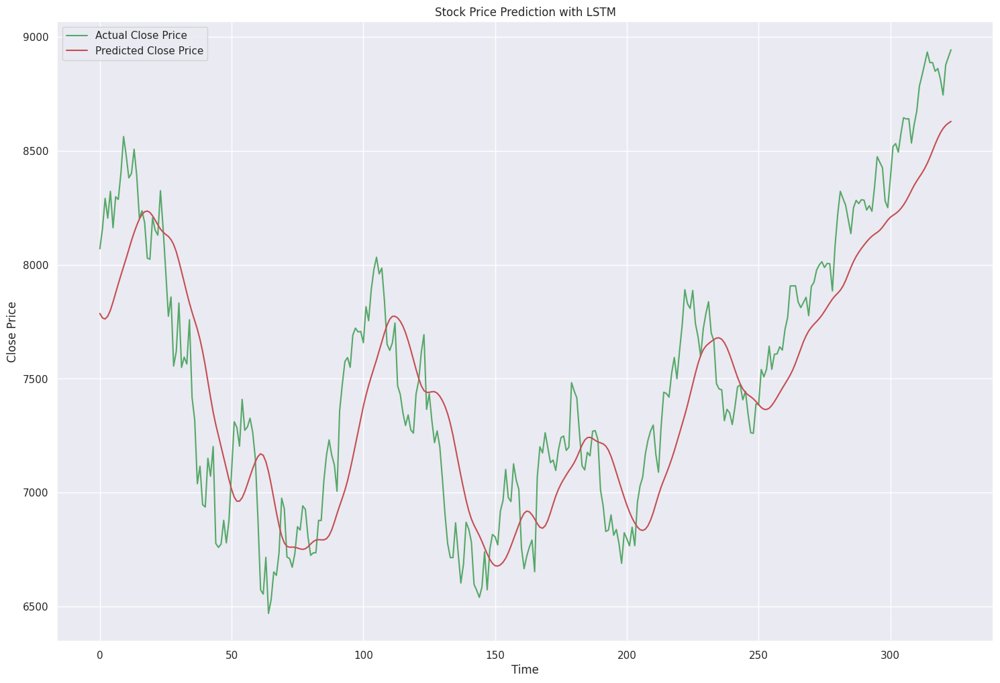

In [ ]:
# Make predictions on the test set
y_pred_scaled = lstm_regressor.predict(X_test)

# Inverse transform the predictions to get actual values
y_pred_lstm = scaler.inverse_transform(y_pred_scaled)

# Inverse transform it to compare accurately
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Plotting
plt.figure(figsize=(18, 12))

# Plot actual close prices from the test set
plt.plot(y_test_actual, label='Actual Close Price', color='g')

# Plot predicted close prices
plt.plot(y_pred_lstm, label='Predicted Close Price', color='r')

plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.xlabel('Time')
plt.ylabel('Close Price')

plt.show()

11/11 [==============================] - 0s 27ms/step


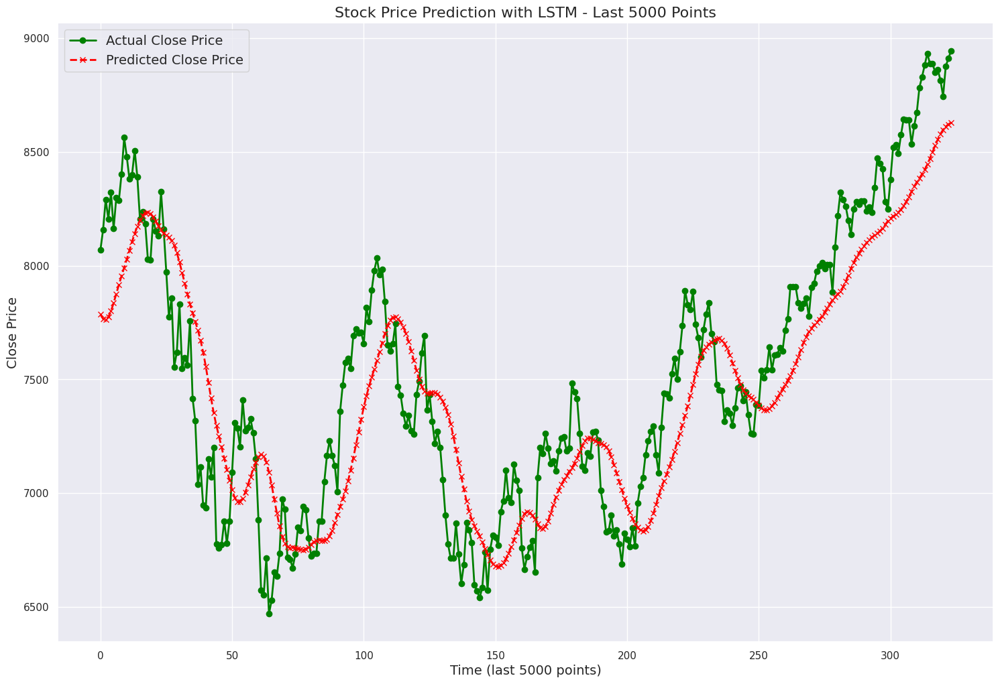

In [ ]:
# Make predictions on the test set
y_pred_scaled = lstm_regressor.predict(X_test)

# Inverse transform the predictions to get actual values
y_pred_lstm = scaler.inverse_transform(y_pred_scaled)

# Inverse transform the actual test set values
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Select a subset for a clearer view
subset_size = 5000
y_test_subset = y_test_actual[-subset_size:]
y_pred_subset = y_pred_lstm[-subset_size:]

# Plotting
plt.figure(figsize=(18, 12))

# Plot actual close prices
plt.plot(y_test_subset, marker='o', linestyle='-', linewidth=2, label='Actual Close Price', color='green')

# Plot predicted close prices
plt.plot(y_pred_subset, marker='x', linestyle='--', linewidth=2, label='Predicted Close Price', color='red')

plt.legend(fontsize=14)
plt.title(f'Stock Price Prediction with LSTM - Last {subset_size} Points', fontsize=16)
plt.xlabel(f'Time (last {subset_size} points)', fontsize=14)
plt.ylabel('Close Price', fontsize=14)
plt.grid(True)

plt.show()


#### Evaluation RNN vs. LSTM

In [ ]:
def evaluate_model(predictions, y_test, model):
    # Calculate RMSE
    rmse = np.sqrt(np.mean((predictions - y_test)**2))
    print(f"{model} Test RMSE: {rmse}")

    # Calculate MAE
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model} Test MAE: {mae}")

    # Calculate MPE
    mpe = np.mean((predictions - y_test) / y_test) * 100
    print(f"{model} Test MPE: {mpe}%")

    # Calculate MAPE
    mape = np.mean(np.abs((predictions - y_test) / y_test)) * 100
    print(f"{model} Test MAPE: {mape}%")

    # Calculate Directional Accuracy
    directional_accuracy = np.mean(np.sign(predictions[1:] - predictions[:-1]) == np.sign(y_test[1:] - y_test[:-1])) * 100
    print(f"{model} Directional Accuracy: {directional_accuracy}%")

In [ ]:
# Make predictions
predictions = rnn_regressor.predict(X_test)

evaluate_model(predictions, y_test, 'RNN')

11/11 [==============================] - 0s 13ms/step
RNN Test RMSE: 0.09242914960677372
RNN Test MAE: 0.026778628654151166
RNN Test MPE: 3.8595024682065597%
RNN Test MAPE: 9.756795001649959%
RNN Directional Accuracy: 50.08195228555819%


In [ ]:
# Make predictions
predictions = lstm_regressor.predict(X_test)

evaluate_model(predictions, y_test, 'LSTM')

11/11 [==============================] - 0s 19ms/step
LSTM Test RMSE: 0.08657814667796392
LSTM Test MAE: 0.027659380449850907
LSTM Test MPE: -0.22123977691283267%
LSTM Test MAPE: 8.87419136972342%
LSTM Directional Accuracy: 50.08195228555819%


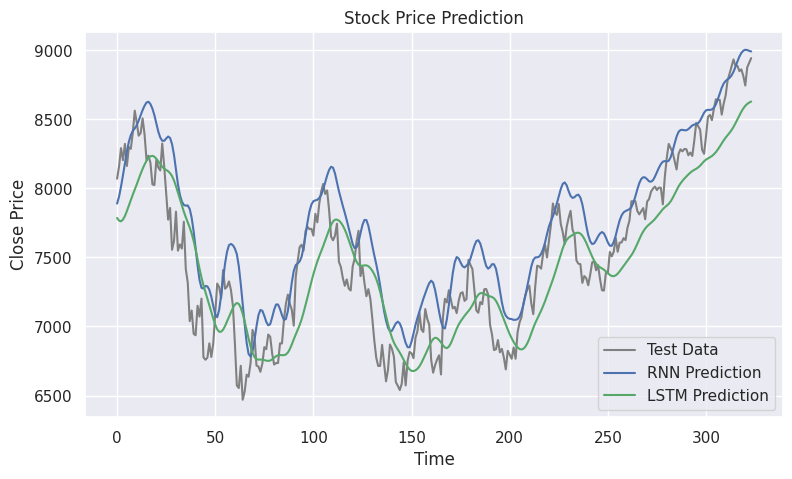

In [ ]:
# Plotting
plt.figure(figsize=(9, 5))

# Plot actual close prices from the test set
plt.plot(y_test_actual, label='Test Data', color='grey')

# Plot predicted close prices with RNN
plt.plot(y_pred_rnn, label='RNN Prediction', color='b')

# Plot predicted close prices with LSTM
plt.plot(y_pred_lstm, label='LSTM Prediction', color='g')

plt.legend()
plt.title('Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Close Price')

plt.show()

### Statistical Models

#### Auto ARIMA

In [ ]:
# Selecting the Close Values
arima_train = ts_train['Close'].values
arima_test = ts_test['Close'].values

In [ ]:
#Auto-fit of the ARIMA model
auto_arima = pm.auto_arima(arima_train, seasonal=False)
auto_arima

In [ ]:
auto_arima.summary()

In [ ]:
x_arima=[]
for i in range(len(arima_train)+len(arima_test)):
  x_arima.append(i)

In [ ]:
forecast_arima_auto = auto_arima.predict(n_periods=len(arima_test))

Text(0, 0.5, 'Close Price')

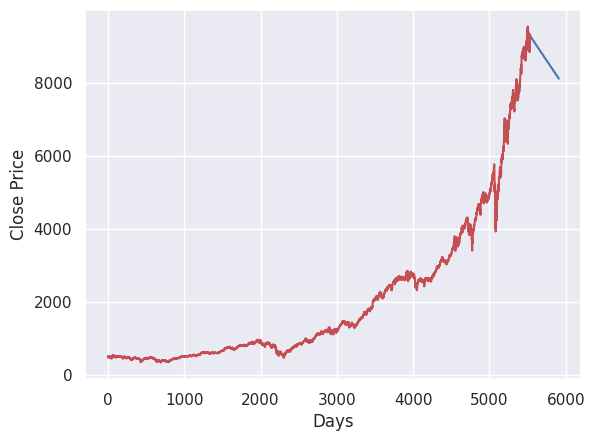

In [ ]:
plt.plot(x_arima, [None]*len(arima_train) + list(forecast_arima_auto), label='ARIMA', color='b')
plt.plot(arima_train, label='historical data', color='r')

plt.xlabel('Days')
plt.ylabel('Close Price')

####Auto ARIMA (5 days steps)

In [ ]:
train= arima_train.tolist()
test= arima_test.tolist()

In [ ]:
# DO NOT RUN AGAIN (1+ hours )
# ARIMA doesn't seem accurate for long term prediction so only predicting the next 5 days each time (1 day at a time would be the best but would take 5+ hours)
forecast_arima_auto_5days = auto_arima.predict(n_periods=5)
for i in range(1,int(len(arima_test)/5)):
  auto_arima_5 = pm.auto_arima(train+test[5*i:5*(i+1)], seasonal=False)
  forecast_arima_auto_5days = np.concatenate((forecast_arima_auto_5days, auto_arima_5.predict(n_periods=5)),axis=0)

In [ ]:
df=pd.DataFrame(forecast_arima_auto_5days)
df.to_csv("forecast_arima_auto_5days")

Text(0, 0.5, 'Close Price')

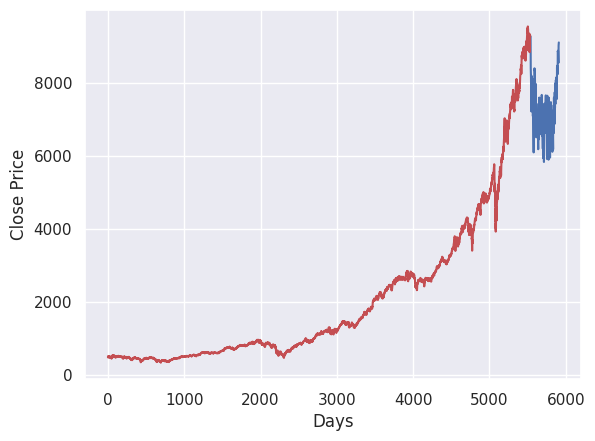

In [ ]:
plt.plot(x_arima, [None]*len(arima_train) + list(forecast_arima_auto_5days), label='ARIMA', color='b')
plt.plot(arima_train, label='historical data', color='r')

plt.xlabel('Days')
plt.ylabel('Close Price')

#### Manual ARIMA

In [ ]:
#Test for stationarity (p-value > 0.05 => non-stationary)
from statsmodels.tsa.stattools import adfuller
adf_test = adfuller(arima_train)
print(adf_test)
print(f'p-value: {adf_test[1]}')

(5.623602742106369, 1.0, 31, 5504, {'1%': -3.4315386541431767, '5%': -2.8620652671839455, '10%': -2.5670495985385364}, 54075.66586862693)
p-value: 1.0


<Axes: >

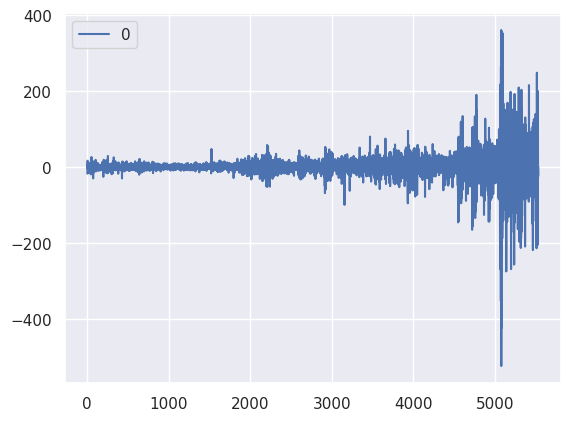

In [ ]:
# Differentiate the time-series
df_train = pd.DataFrame(arima_train)
arima_train_diff = df_train.diff().dropna()
#arima_train_diff.plot()

In [ ]:
#Check for stationarity again
adf_test = adfuller(arima_train_diff)
print(f'p-value: {adf_test[1]}')

p-value: 4.7352564262924274e-27


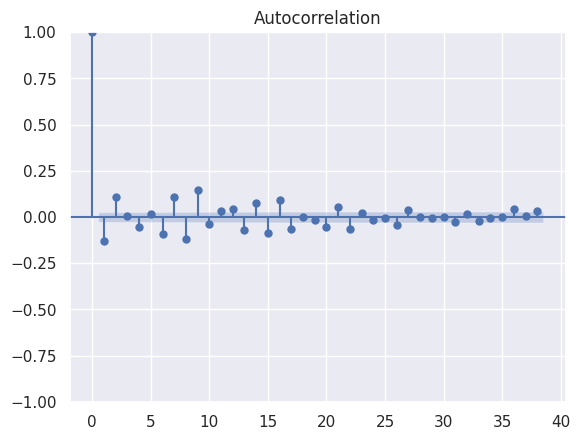

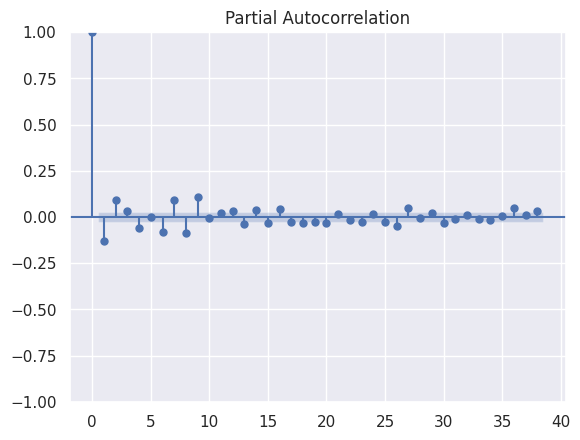

In [ ]:
#Determining other parameters (p,q)
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

acf_diff = plot_acf(arima_train_diff)
pacf_diff = plot_pacf(arima_train_diff)

In [ ]:
#Create the model
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(arima_train, order=(2,1,0))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 5536
Model:                 ARIMA(2, 1, 0)   Log Likelihood              -27338.981
Date:                Tue, 26 Mar 2024   AIC                          54683.962
Time:                        09:52:55   BIC                          54703.818
Sample:                             0   HQIC                         54690.885
                               - 5536                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1156      0.004    -30.747      0.000      -0.123      -0.108
ar.L2          0.0966      0.003     27.655      0.000       0.090       0.103
sigma2      1142.5489      5.273    216.684      0.0

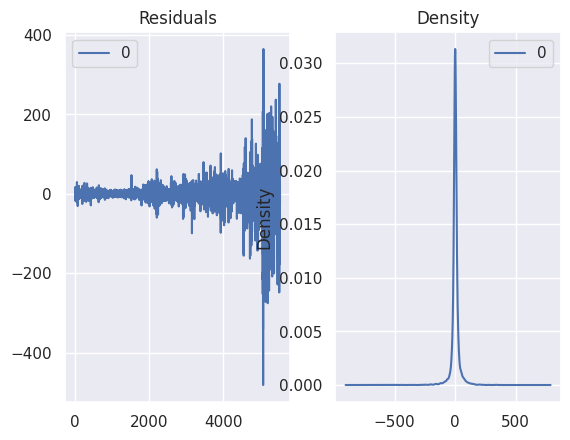

In [ ]:
#Check residuals to see if model really fits
residuals = model_fit.resid[1:]
df_residuals = pd.DataFrame(residuals)
fig, ax =plt.subplots(1,2)
df_residuals.plot(title='Residuals', ax=ax[0])
df_residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.show()

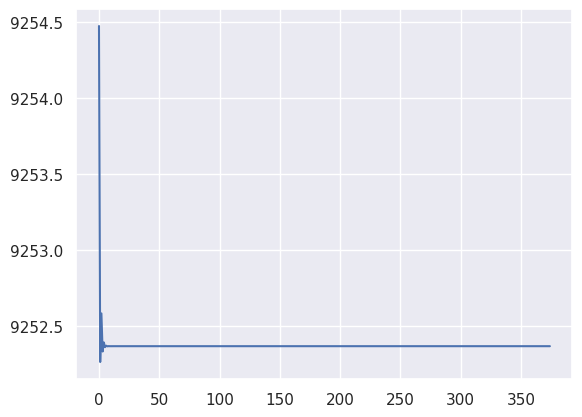

In [ ]:
forecast_manual_arima = model_fit.forecast(len(arima_test))
plt.plot(forecast_manual_arima)

Text(0, 0.5, 'Close Price')

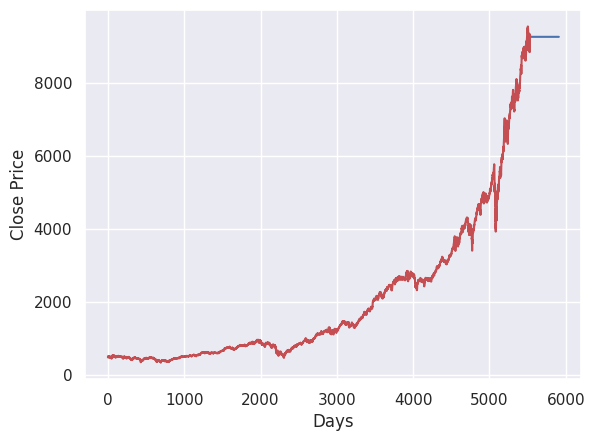

In [ ]:
plt.plot(x_arima, [None]*len(arima_train) + list(forecast_manual_arima), label='ARIMA', color='b')
plt.plot(arima_train, label='historical data', color='r')

plt.xlabel('Days')
plt.ylabel('Close Price')

### Indicators

References:

[1] **Python Trading Guide: MACD** https://blog.stackademic.com/python-trading-guide-macd-b4aa256f9bed

[2] **Python Trading Guide: Leveraging RSI** https://python.plainenglish.io/python-trading-guide-leveraging-rsi-9b44ac0c66de

[3] **Python Trading Guide: Bollinger Bands** https://towardsdev.com/python-trading-guide-bollinger-bands-111ccc318bdc

[4] **Python Trading Guide: Support & Resistance** https://blog.stackademic.com/python-trading-guide-support-resistance-89a5e78edc97

[5] **A new moving average approach to predict the direction of stock movements in algorithmic trading** https://doi.org/10.54187/jnrs.979836

In [ ]:
data = ts_test.copy()
data.set_index('Date', inplace=True)
data.head()

,Close
Date,
2022-01-03 05:00:00+00:00,9281.437313
2022-01-04 05:00:00+00:00,9205.388985
2022-01-05 05:00:00+00:00,8935.563831
2022-01-06 05:00:00+00:00,8938.839558
2022-01-07 05:00:00+00:00,8850.957260


In [ ]:
days_predicted = len(y_pred_rnn)
print(f'Number of days predicted in the RNN model: {days_predicted}')

Number of days predicted in the RNN model: 324


In [ ]:
values_delay = sequence_length
print(f'Sequence length defined in the RNN model: {values_delay}')

Sequence length defined in the RNN model: 50


In [ ]:
data = data[values_delay:values_delay+days_predicted]

In [ ]:
start_date = data.index.min().strftime('%Y-%m-%d')
end_date = data.index.max().strftime('%Y-%m-%d')

start_date, end_date

('2022-03-16', '2023-06-29')

#### Moving Average Convergence Divergence (MACD)

The MACD is a trend-following momentum indicator that shows the relationship between two moving averages of a security's price. It consists of three components:

*   **MACD Line**: The difference between the 26-day Exponential Moving Average (EMA) and the 12-day EMA.
*   **Signal Line**: The 9-day EMA of the MACD Line.
*   **MACD Histogram**: The difference between the MACD Line and the Signal Line.

It helps in identifying trend direction, momentum, and potential reversals. Particularly useful for capturing trends in fast-moving markets.

In [ ]:
ta.trend.MACD.__init__

<function ta.trend.MACD.__init__(self, close: pandas.core.series.Series, window_slow: int = 26, window_fast: int = 12, window_sign: int = 9, fillna: bool = False)>

In [ ]:
def calculate_macd(data):
    macd_object = ta.trend.MACD(data['Close'])
    data['MACD'] = macd_object.macd()
    data['MACD_Signal'] = macd_object.macd_signal()
    data['MACD_Diff'] = macd_object.macd_diff()
    return data

In [ ]:
def plot_macd(data):
    # Plotting
    plt.figure(figsize=(14, 7))

    # Plotting Close Price
    plt.subplot(2, 1, 1)
    plt.plot(data['Close'], label='Close Price')
    plt.title('S&P500 Price and MACD')
    plt.legend()

    # Plotting MACD
    plt.subplot(2, 1, 2)
    plt.plot(data['MACD'], label='MACD Line', color='blue')
    plt.plot(data['MACD_Signal'], label='Signal Line', color='red')
    plt.bar(data.index, data['MACD_Diff'], label='Histogram', color='grey', alpha=0.5)
    plt.legend()

    plt.show()

In [ ]:
data = calculate_macd(data)
data.tail()

,Close,MACD,MACD_Signal,MACD_Diff
Date,,,,
2023-06-23 04:00:00+00:00,8815.277851,149.708615,154.703236,-4.994621
2023-06-26 04:00:00+00:00,8746.143059,135.080617,150.778712,-15.698095
2023-06-27 04:00:00+00:00,8878.032730,132.601668,147.143303,-14.541635
2023-06-28 04:00:00+00:00,8912.149384,131.869898,144.088622,-12.218724
2023-06-29 04:00:00+00:00,8944.502365,132.374648,141.745827,-9.371180


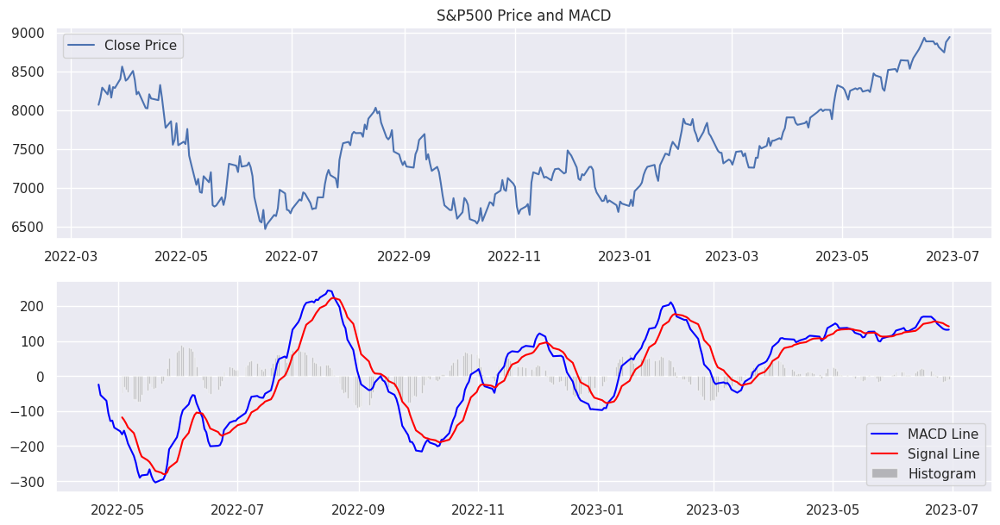

In [ ]:
plot_macd(data.loc[start_date:end_date]) # Plot 1.5 years

#### Relative Strength Index (RSI)

The RSI is a momentum oscillator that measures the speed and change of price movements on a scale of 0 to 100. It is typically used to identify overbought or oversold conditions in a traded asset.

The standard period used for calculating RSI is 14 days, with high levels above 70 indicating overbought conditions and levels below 30 suggesting oversold conditions.

In [ ]:
ta.momentum.RSIIndicator.__init__

<function ta.momentum.RSIIndicator.__init__(self, close: pandas.core.series.Series, window: int = 14, fillna: bool = False)>

In [ ]:
def calculate_rsi(data):
    data['RSI'] = ta.momentum.RSIIndicator(data['Close']).rsi()
    return data

In [ ]:
def plot_rsi(data):
    upper_limit = 70
    lower_limit = 30

    plt.figure(figsize=(10, 6))
    plt.plot(data.index, data['RSI'])
    plt.axhline(y=upper_limit, color='r', linestyle='--', label='Overbought (70)')
    plt.axhline(y=lower_limit, color='g', linestyle='--', label='Oversold (30)')
    plt.title('RSI of S&P500')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
data = calculate_rsi(data)
data.tail()

,Close,MACD,MACD_Signal,MACD_Diff,RSI
Date,,,,,
2023-06-23 04:00:00+00:00,8815.277851,149.708615,154.703236,-4.994621,63.790979
2023-06-26 04:00:00+00:00,8746.143059,135.080617,150.778712,-15.698095,57.822545
2023-06-27 04:00:00+00:00,8878.032730,132.601668,147.143303,-14.541635,64.622776
2023-06-28 04:00:00+00:00,8912.149384,131.869898,144.088622,-12.218724,66.143417
2023-06-29 04:00:00+00:00,8944.502365,132.374648,141.745827,-9.371180,67.567125


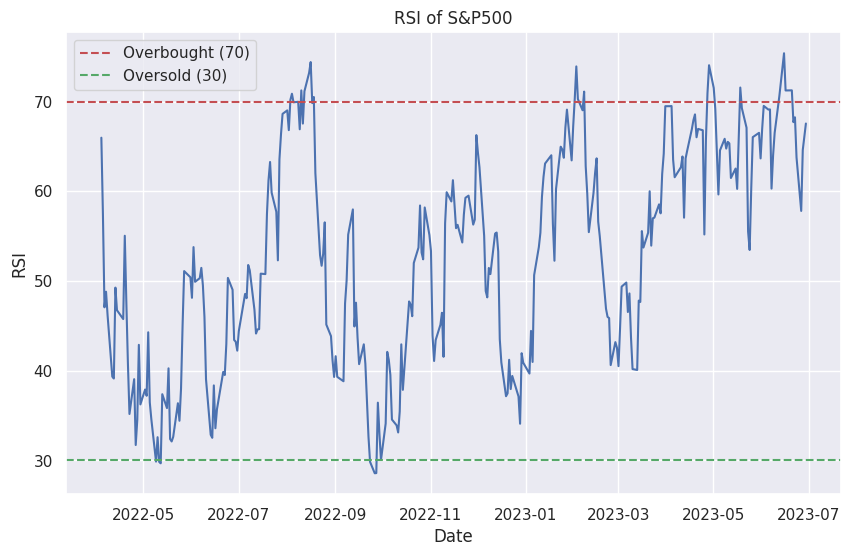

In [ ]:
plot_rsi(data.loc[start_date:end_date])

#### Bollinger Bands (BB)

Bollinger Bands consist of a middle band being a Simple Moving Average (SMA) along with an upper and lower band that are set two standard deviations away from the middle band.

The standard window for the SMA is 20 days.

The spacing between the bands adjusts based on the volatility of the prices.

Narrower bands indicate low volatility, while wider bands show high volatility.

In [ ]:
ta.volatility.BollingerBands.__init__

<function ta.volatility.BollingerBands.__init__(self, close: pandas.core.series.Series, window: int = 20, window_dev: int = 2, fillna: bool = False)>

In [ ]:
def calculate_bb(data):
    indicator_bb = ta.volatility.BollingerBands(close=data["Close"], window=20, window_dev=2)
    data['bb_bbm'] = indicator_bb.bollinger_mavg()   # Middle Band
    data['bb_bbh'] = indicator_bb.bollinger_hband()  # Upper Band
    data['bb_bbl'] = indicator_bb.bollinger_lband()  # Lower Band
    return data

In [ ]:
def plot_bb(data):
    plt.figure(figsize=(14,7))
    plt.plot(data['Close'], label='S&P500 Prices', color='blue')
    plt.plot(data['bb_bbh'], label='Upper Band', color='red')
    plt.plot(data['bb_bbm'], label='Middle Band (SMA)', color='green')
    plt.plot(data['bb_bbl'], label='Lower Band', color='red')
    plt.title('Bollinger Bands for S&P500')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
data = calculate_bb(data)
data.tail()

,Close,MACD,MACD_Signal,MACD_Diff,RSI,bb_bbm,bb_bbh,bb_bbl
Date,,,,,,,,
2023-06-23 04:00:00+00:00,8815.277851,149.708615,154.703236,-4.994621,63.790979,8699.672596,9019.531558,8379.813633
2023-06-26 04:00:00+00:00,8746.143059,135.080617,150.778712,-15.698095,57.822545,8717.999154,9002.446753,8433.551554
2023-06-27 04:00:00+00:00,8878.032730,132.601668,147.143303,-14.541635,64.622776,8735.913528,9013.200318,8458.626737
2023-06-28 04:00:00+00:00,8912.149384,131.869898,144.088622,-12.218724,66.143417,8754.892360,9025.797324,8483.987397
2023-06-29 04:00:00+00:00,8944.502365,132.374648,141.745827,-9.371180,67.567125,8777.369262,9032.411473,8522.327051


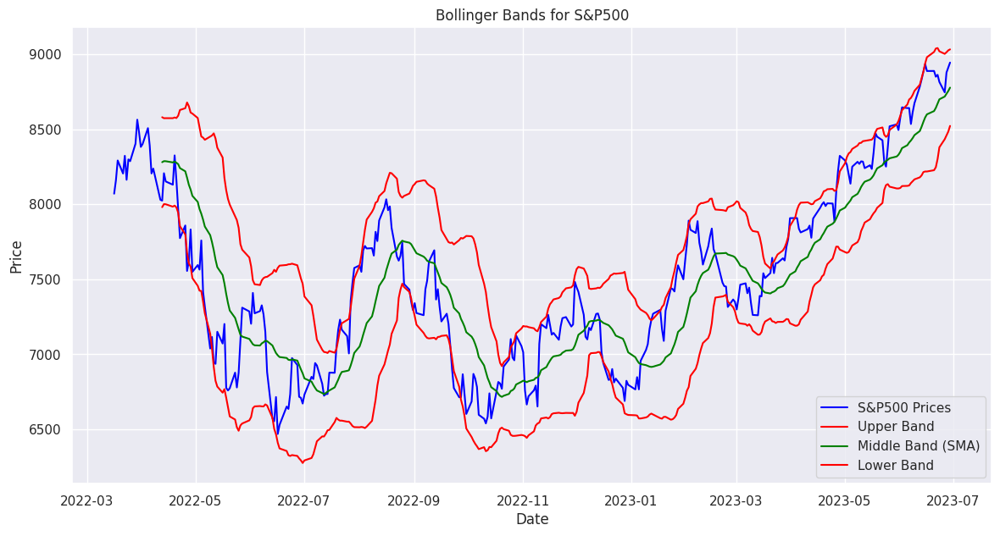

In [ ]:
plot_bb(data.loc[start_date:end_date])

#### Support and Resistance (S/R)

Support and resistance levels are a crucial part of swing trading and help traders identify potential points where the price might reverse or consolidate. These levels are found by identifying the price points where a trend has historically reversed or slowed down.

For the trading, a window of 10 is chosen to identify these levels.

* **Support**: The price level at which demand is thought to be strong enough to prevent the price from declining further.
* **Resistance**: The price level at which selling is thought to be strong enough to prevent the price from rising further.

In [ ]:
def calculate_sr(data):
    WINDOW = 10

    data['min'] = data.iloc[argrelextrema(data['Close'].values, np.less_equal, order=WINDOW)[0]]['Close']
    data['max'] = data.iloc[argrelextrema(data['Close'].values, np.greater_equal, order=WINDOW)[0]]['Close']
    return data

In [ ]:
def plot_sr(data):
    plt.figure(figsize=(9, 5))
    plt.plot(data.index, data['Close'], label='Price', color='grey')
    plt.scatter(data.index, data['min'], color='green', label='Support', marker='^', alpha=0.7)
    plt.scatter(data.index, data['max'], color='red', label='Resistance', marker='v', alpha=0.7)
    plt.title('Support and Resistance Levels for S&P500')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()

In [ ]:
data = calculate_sr(data)
data.tail()

,Close,MACD,MACD_Signal,MACD_Diff,RSI,bb_bbm,bb_bbh,bb_bbl,min,max
Date,,,,,,,,,,
2023-06-23 04:00:00+00:00,8815.277851,149.708615,154.703236,-4.994621,63.790979,8699.672596,9019.531558,8379.813633,NaN,NaN
2023-06-26 04:00:00+00:00,8746.143059,135.080617,150.778712,-15.698095,57.822545,8717.999154,9002.446753,8433.551554,NaN,NaN
2023-06-27 04:00:00+00:00,8878.032730,132.601668,147.143303,-14.541635,64.622776,8735.913528,9013.200318,8458.626737,NaN,NaN
2023-06-28 04:00:00+00:00,8912.149384,131.869898,144.088622,-12.218724,66.143417,8754.892360,9025.797324,8483.987397,NaN,NaN
2023-06-29 04:00:00+00:00,8944.502365,132.374648,141.745827,-9.371180,67.567125,8777.369262,9032.411473,8522.327051,NaN,8944.502365


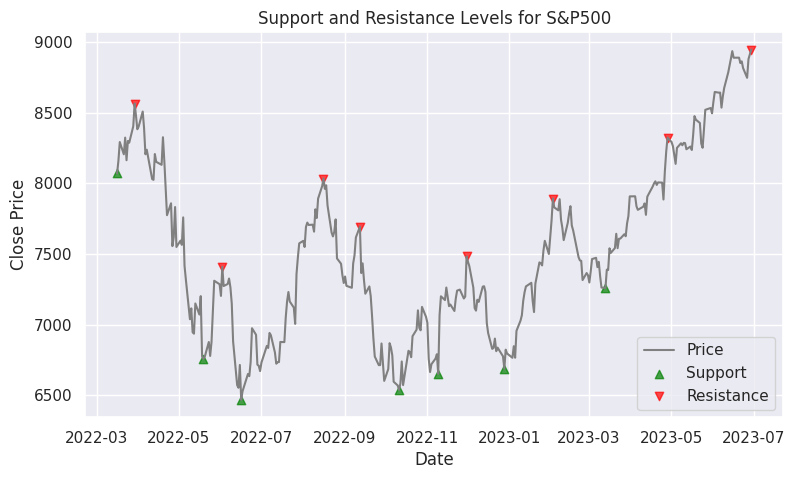

In [ ]:
plot_sr(data.loc[start_date:end_date])

### Profit and Loss Analysis (P&L)

#### Generate Buy and Sell Signals

The function simulates trades based on the technical indicators. Tracks capital changes and trading effectiveness through simulated buy and sell actions.
* **Buy Signals**: Generated when indicators suggest an upward trend or undervalued conditions.
* **Sell Signals**: Triggered by indicators indicating a downward trend or overvalued conditions.

In [ ]:
indicators = ['MACD', 'RSI', 'BB', 'SR']

In [ ]:
def trade_with_indicator(data, initial_capital, indicator):
    current_capital = initial_capital
    is_holding = False
    shares_to_buy = 0
    gross_profits = 0
    gross_losses = 0
    daily_capital = [initial_capital]

    for i in range(1, len(data)):
        current_price = data['Close'][i]

        if indicator == 'RSI':
            current_indicator_value = data['RSI'][i]
            oversold_limit = 30
            overbought_limit = 70
            buy_condition = current_indicator_value < oversold_limit and not is_holding
            sell_condition = current_indicator_value > overbought_limit and is_holding

        elif indicator == 'BB':
            lower_band = data['bb_bbl'][i]
            upper_band = data['bb_bbh'][i]
            buy_condition = current_price < lower_band and not is_holding
            sell_condition = current_price > upper_band and is_holding

        elif indicator == 'MACD':
            macd = data['MACD'][i]
            macd_signal = data['MACD_Signal'][i]
            buy_condition = macd > macd_signal and not is_holding
            sell_condition = macd < macd_signal and is_holding

        elif indicator == 'SR':  # Support and Resistance
            support = data['min'][i] if 'min' in data.columns else None
            resistance = data['max'][i] if 'max' in data.columns else None
            buy_condition = support is not None and current_price <= support * 1.01 and not is_holding
            sell_condition = resistance is not None and current_price >= resistance * 0.99 and is_holding

        else:
            raise ValueError("Invalid indicator specified.")

        if buy_condition:
            shares_to_buy = current_capital / current_price
            buy_price = current_price  # Store the price at which the shares are bought
            current_capital = 0
            is_holding = True
            print(f"Buy {shares_to_buy} shares at {current_price} using {indicator}")

        elif sell_condition:
            sell_price = current_price  # The price at which the shares are sold
            current_capital = sell_price * shares_to_buy
            profit_or_loss = (sell_price - buy_price) * shares_to_buy
            if profit_or_loss > 0:
                gross_profits += profit_or_loss
            else:
                gross_losses += abs(profit_or_loss)
            is_holding = False
            print(f"Sell {shares_to_buy} shares at {current_price} using {indicator}. Current capital: {current_capital}")

        # Record the capital for the day, whether a trade was made or not
        daily_capital.append(current_capital if not is_holding else current_price * shares_to_buy)

    if is_holding:
        current_price = data['Close'][-1]
        sell_price = current_price
        final_capital =  sell_price * shares_to_buy
        unrealized_profit_or_loss = (sell_price - buy_price) * shares_to_buy
        if unrealized_profit_or_loss > 0:
            gross_profits += unrealized_profit_or_loss
        else:
            gross_losses += abs(unrealized_profit_or_loss)

        # Adjust the final value if holding shares at the end, don't append a new value
        daily_capital[-1] = current_price * shares_to_buy

        print(f"Final capital (holding shares) using {indicator}: ${final_capital}")
    else:
        final_capital = current_capital
        print(f"Final capital using {indicator}: ${final_capital}")

    # Ensure the length of daily_capital matches the data, excluding the initial capital entry
    assert len(daily_capital) == len(data), "The daily capital list length must match the data length."

    capital_df = pd.DataFrame(daily_capital, index=data.index[:len(daily_capital)], columns=['Capital'])

    return final_capital, capital_df

#### Trading Strategies

*test_trading_strategies* compares the performance of different trading indicators on actual and predicted S&P 500 data.
It simulates trading for both actual and predicted data sets, calculating the final capital for each.
Results are visualized in a bar chart showing the capital achieved using actual vs. predicted data for each indicator.

In [ ]:
def test_trading_strategies(actual_data, predicted_data, start_date, end_date, initial_capital, model, indicators):
    print(f'Testing Trading Strategies for the {model} model')

    final_capitals_actual = []
    final_capitals_pred = []
    capital_dfs_actual = {}
    capital_dfs_pred = {}

    for indicator in indicators:
        print(f'\n{indicator}\n')

        # Filter the data for the current period
        sample_actual = actual_data.loc[start_date:end_date].copy()
        sample_pred = predicted_data.loc[start_date:end_date].copy()

        # Calculate the indicator values for the actual and predicted data
        if indicator == 'MACD':
            sample_actual = calculate_macd(sample_actual)
            sample_pred = calculate_macd(sample_pred)
        elif indicator == 'RSI':
            sample_actual = calculate_rsi(sample_actual)
            sample_pred = calculate_rsi(sample_pred)
        elif indicator == 'BB':
            sample_actual = calculate_bb(sample_actual)
            sample_pred = calculate_bb(sample_pred)
        elif indicator == 'SR':
            sample_actual = calculate_sr(sample_actual)
            sample_pred = calculate_sr(sample_pred)

        # Trade with the actual and predicted data, receiving the capital progression DataFrame
        print(' - Actual Data')
        capital_actual, capital_df_actual = trade_with_indicator(sample_actual, initial_capital, indicator)
        print(' - Predicted Data')
        capital_pred, capital_df_pred = trade_with_indicator(sample_pred, initial_capital, indicator)
        print('\n')

        final_capitals_actual.append(capital_actual)
        final_capitals_pred.append(capital_pred)

        # Store the DataFrames in a dictionary keyed by the indicator
        capital_dfs_actual[indicator] = capital_df_actual
        capital_dfs_pred[indicator] = capital_df_pred

    df = pd.DataFrame({
        'Indicator': indicators,
        'Actual Capital': final_capitals_actual,
        'Predicted Capital': final_capitals_pred
    })
    df = df.set_index('Indicator')

    return df, capital_dfs_actual, capital_dfs_pred, final_capitals_actual, final_capitals_pred

In [ ]:
def display_indicator_comparison(indicators, capitals_actual, capitals_pred_rnn, capitals_pred_lstm, initial_capital, start_date, end_date):
    # Creating the bar positions
    n = len(indicators)
    index = np.arange(n)
    bar_width = 0.25

    # Creating the plot
    fig, ax = plt.subplots(figsize=(9, 5))


    bar1 = ax.bar(index, capitals_actual, bar_width, label='Actual', color='grey', alpha=0.6)
    bar2 = ax.bar(index + bar_width, capitals_pred_rnn, bar_width, label=f'RNN Predicted', color='b', alpha=0.6)
    bar3 = ax.bar(index + bar_width*2, capitals_pred_lstm, bar_width, label=f'LSTM Predicted', color='g', alpha=0.6)

    # Adding initial capital line for reference
    ax.axhline(y=initial_capital, color='k', linestyle='--', label='Initial Capital')

    # Customizing the plot
    ax.set_xlabel('Indicator', fontsize=14)
    ax.set_ylabel('Capital', fontsize=14)
    ax.set_title(f'Aggregate Performance of Trading Strategies for the Models', fontsize=16)
    ax.set_xticks(index + bar_width*2 / 3)
    ax.set_xticklabels(indicators)
    ax.legend()

    # Adding text for labels, title and axes ticks
    ax.set_xticks(index + bar_width*2 / 2)
    ax.set_xticklabels(indicators)

    # Adding the subtitle
    original_format = '%Y-%m-%d'
    start_date_dt = datetime.datetime.strptime(start_date, original_format)
    end_date_dt = datetime.datetime.strptime(end_date, original_format)
    date_range_text = f"From {start_date_dt.strftime('%d-%m-%Y')} to {end_date_dt.strftime('%d-%m-%Y')}"
    # Position the text just below the title. Adjust y as needed.
    ax.text(0.82, 1.12, date_range_text, transform=ax.transAxes, fontsize=11, ha='center', va='bottom')

    plt.show()

* **Absolute Difference**

Measures the discrepancy between the actual capital achieved using a specific indicator and the predicted capital, adjusted by the initial investment. It helps in understanding the prediction error in monetary terms.

$$
\text{Absolute Difference} = | (\text{Actual Capital} - \text{Initial Capital}) - (\text{Predicted Capital} - \text{Initial Capital}) |
$$

* **Return on Investment (ROI)**

ROI is a measure of the profitability of an investment. It compares the gain (or loss) from an investment to its cost. Provides insight into the efficiency of an investment, allowing for the comparison of the effectiveness of different trading indicators.

$$
\text{ROI (%)} = \left( \frac{\text{Capital} - \text{Initial Capital}}{\text{Initial Capital}} \right) \times 100
$$

* **Percentage Error**

Quantifies the deviation of the predicted capital from the actual capital, expressed as a percentage of the actual capital.

$$
\text{Percentage Error (%)} = \left( \frac{|\text{Actual Capital} - \text{Predicted Capital}|}{\text{Actual Capital}} \right) \times 100
$$

In [ ]:
def calculate_reliability_and_benefit_assesment(initial_capital, df):
    # Calculate Absolute Difference and Percentage Error for each row in the DataFrame
    df['Absolute Difference'] = abs((df['Actual Capital'] - initial_capital) -
                                    (df['Predicted Capital'] - initial_capital))
    df['Percentage Error'] = abs((df['Actual Capital'] - df['Predicted Capital']) /
                                 df['Actual Capital']) * 100

    # Calculate the Actual ROI and Predicted ROI for each row in the DataFrame
    df['Actual ROI (%)'] = ((df['Actual Capital'] - initial_capital) / initial_capital) * 100
    df['Predicted ROI (%)'] = ((df['Predicted Capital'] - initial_capital) / initial_capital) * 100

    # Find the indicator with the minimum Average Percentage Error
    most_accurate_indicator = df['Percentage Error'].idxmin()

    return df

* **Normalisation**

It is performed to calculate a combined score: the error from the ROI is subtracted because a lower error is better, so its normalised value should reduce the score. Whereas a higher ROI is better, so it should increase the score.
$$
\text{Normalised } S = \frac{S - \min(S)}{\max(S) - \min(S)}
$$

* **Score**

The Score formula is designed to evaluate the balance between accuracy and profitability of trading indicators. It aims to identify the indicator that offers a good trade-off between minimising prediction errors and maximising returns, with a higher score indicating a more favorable balance.

$$
\text{Score} = \text{Normalised Actual ROI} - \text{Normalised Error}
$$



In [ ]:
# Identifies the most balanced indicator based on accuracy and profitability.

def normalise_series(s):
    """Normalize a pandas Series to be between 0 and 1."""
    return (s - s.min()) / (s.max() - s.min())

def recommend_indicator(df, model):
    # Normalise the Percentage Error and Actual ROI
    df['Normalised Error'] = normalise_series(df['Percentage Error'])
    df['Normalised Actual ROI'] = normalise_series(df['Actual ROI (%)'])

    # Calculate a combined score: We subtract the error from the ROI because a lower error is better,
    # so its normalised value should reduce the score, whereas a higher ROI is better, so it should increase the score.
    df['Score'] = df['Normalised Actual ROI'] - df['Normalised Error']

    # Select the indicator with the highest score
    best_indicator = df['Score'].idxmax()
    accuracy = df.loc[best_indicator, 'Percentage Error']
    profitability = df.loc[best_indicator, 'Actual ROI (%)']

    advice = f"The best indicator to base your investment on for the {model} model is '{best_indicator}'. " \
             f"\nIt offers the best balance between accuracy (low error) and profitability (high ROI)." \
             f"\nError: {accuracy:.2f}%" \
             f"\nProfitability: {profitability:.2f}%\n"

    print(advice)
    print(df)

    return best_indicator

Average for the Models

In [ ]:
def assess_trading_model_accuracy(capitals_actual, capitals_pred_rnn, capitals_pred_lstm, initial_capital):
    # Calculate Absolute Errors for each model
    absolute_errors_rnn = [abs(actual - pred) for actual, pred in zip(capitals_actual, capitals_pred_rnn)]
    absolute_errors_lstm = [abs(actual - pred) for actual, pred in zip(capitals_actual, capitals_pred_lstm)]

    # Calculate Average Percentage Errors for each model
    average_percentage_error_rnn = sum(absolute_errors_rnn) / sum(capitals_actual) * 100
    average_percentage_error_lstm = sum(absolute_errors_lstm) / sum(capitals_actual) * 100

    # Calculate Average Benefits for each model and the actual data as a percentage of the initial capital
    average_benefits_rnn = (sum(capitals_pred_rnn) / len(capitals_pred_rnn) - initial_capital) / initial_capital * 100
    average_benefits_lstm = (sum(capitals_pred_lstm) / len(capitals_pred_lstm) - initial_capital) / initial_capital * 100
    average_benefits_actual = (sum(capitals_actual) / len(capitals_actual) - initial_capital) / initial_capital * 100

    # Print the results
    print(f"RNN Model: Average Percentage Error: {average_percentage_error_rnn:.2f}%, Average Benefits: {average_benefits_rnn:.2f}%")
    print(f"LSTM Model: Average Percentage Error: {average_percentage_error_lstm:.2f}%, Average Benefits: {average_benefits_lstm:.2f}%")
    print(f"Actual Data: Average Benefits: {average_benefits_actual:.2f}%")

#### Experiment with Predicted and Actual Data

In [ ]:
initial_capital = 100000

##### RNN

In [ ]:
data_predicted_rnn = data.copy()
data_predicted_rnn['Close'] = y_pred_rnn

In [ ]:
results_rnn, acc_capital_actual_rnn, acc_capital_pred_rnn, capital_values_actual_rnn, capital_values_pred_rnn = test_trading_strategies(data, data_predicted_rnn, start_date, end_date, initial_capital, 'RNN', indicators)

Testing Trading Strategies for the RNN model

MACD

 - Actual Data
Buy 14.098809946910597 shares at 7092.7972202301025 using MACD
Sell 14.098809946910597 shares at 6572.666633605957 using MACD. Current capital: 92666.77771161105
Buy 13.285508612208742 shares at 6975.026731491089 using MACD
Sell 13.285508612208742 shares at 7651.778533935547 using MACD. Current capital: 101657.7696113147
Buy 15.08300111904525 shares at 6739.890079498291 using MACD
Sell 15.08300111904525 shares at 6720.331806182861 using MACD. Current capital: 101362.77215301148
Buy 14.338925799961988 shares at 7069.063161849976 using MACD
Sell 14.338925799961988 shares at 7117.3167552948 using MACD. Current capital: 102054.67684899835
Buy 14.670371037741594 shares at 6956.516408920288 using MACD
Sell 14.670371037741594 shares at 7598.09455871582 using MACD. Current capital: 111466.86635620656
Buy 14.782615039076248 shares at 7540.4024295806885 using MACD
Sell 14.782615039076248 shares at 7885.409549713135 using MACD. Cu

In [ ]:
# Get balanced investment advice
assesment = calculate_reliability_and_benefit_assesment(initial_capital, results_rnn.copy())
recommended_indicator_rnn = recommend_indicator(assesment, 'RNN')

The best indicator to base your investment on for the RNN model is 'SR'. 
It offers the best balance between accuracy (low error) and profitability (high ROI).
Error: 2.81%
Profitability: 110.63%

           Actual Capital  Predicted Capital  Absolute Difference  \
Indicator                                                           
MACD        118959.596838      138051.116865         19091.520027   
RSI         124778.451500      101049.518404         23728.933095   
BB           95324.547041       90292.049532          5032.497509   
SR          210631.480275      204722.466842          5909.013434   

           Percentage Error  Actual ROI (%)  Predicted ROI (%)  \
Indicator                                                        
MACD              16.048743       18.959597          38.051117   
RSI               19.016852       24.778451           1.049518   
BB                 5.279330       -4.675453          -9.707950   
SR                 2.805380      110.631480         104.72

##### LSTM

In [ ]:
data_predicted_lstm = data.copy()
data_predicted_lstm['Close'] = y_pred_lstm

In [ ]:
results_lstm, acc_capital_actual_lstm, acc_capital_pred_lstm, capital_values_actual_lstm, capital_values_pred_lstm = test_trading_strategies(data, data_predicted_lstm, start_date, end_date, initial_capital, 'LSTM', indicators)

Testing Trading Strategies for the LSTM model

MACD

 - Actual Data
Buy 14.098809946910597 shares at 7092.7972202301025 using MACD
Sell 14.098809946910597 shares at 6572.666633605957 using MACD. Current capital: 92666.77771161105
Buy 13.285508612208742 shares at 6975.026731491089 using MACD
Sell 13.285508612208742 shares at 7651.778533935547 using MACD. Current capital: 101657.7696113147
Buy 15.08300111904525 shares at 6739.890079498291 using MACD
Sell 15.08300111904525 shares at 6720.331806182861 using MACD. Current capital: 101362.77215301148
Buy 14.338925799961988 shares at 7069.063161849976 using MACD
Sell 14.338925799961988 shares at 7117.3167552948 using MACD. Current capital: 102054.67684899835
Buy 14.670371037741594 shares at 6956.516408920288 using MACD
Sell 14.670371037741594 shares at 7598.09455871582 using MACD. Current capital: 111466.86635620656
Buy 14.782615039076248 shares at 7540.4024295806885 using MACD
Sell 14.782615039076248 shares at 7885.409549713135 using MACD. C

In [ ]:
# Get balanced investment advice
assesment = calculate_reliability_and_benefit_assesment(initial_capital, results_lstm.copy())
recommended_indicator_lstm = recommend_indicator(assesment, 'LSTM')

The best indicator to base your investment on for the LSTM model is 'SR'. 
It offers the best balance between accuracy (low error) and profitability (high ROI).
Error: 14.65%
Profitability: 110.63%

           Actual Capital  Predicted Capital  Absolute Difference  \
Indicator                                                           
MACD        118959.596838      146762.614662         27803.017825   
RSI         124778.451500       87331.028541         37447.422959   
BB           95324.547041       85173.880098         10150.666943   
SR          210631.480275      179779.029547         30852.450729   

           Percentage Error  Actual ROI (%)  Predicted ROI (%)  \
Indicator                                                        
MACD              23.371816       18.959597          46.762615   
RSI               30.011130       24.778451         -12.668971   
BB                10.648534       -4.675453         -14.826120   
SR                14.647597      110.631480          79.

#### Model Benefit Comparison

- Compares RNN and LSTM models' performance on S&P 500 predictions.
- Analyses equity curves for volatility and maximum drawdown.
- Visualises and contrasts the models' equity curves to assess risk and return.

In [ ]:
assess_trading_model_accuracy(capital_values_actual_lstm, capital_values_pred_rnn, capital_values_pred_lstm, initial_capital)

RNN Model: Average Percentage Error: 9.78%, Average Benefits: 33.53%
LSTM Model: Average Percentage Error: 19.33%, Average Benefits: 24.76%
Actual Data: Average Benefits: 37.42%


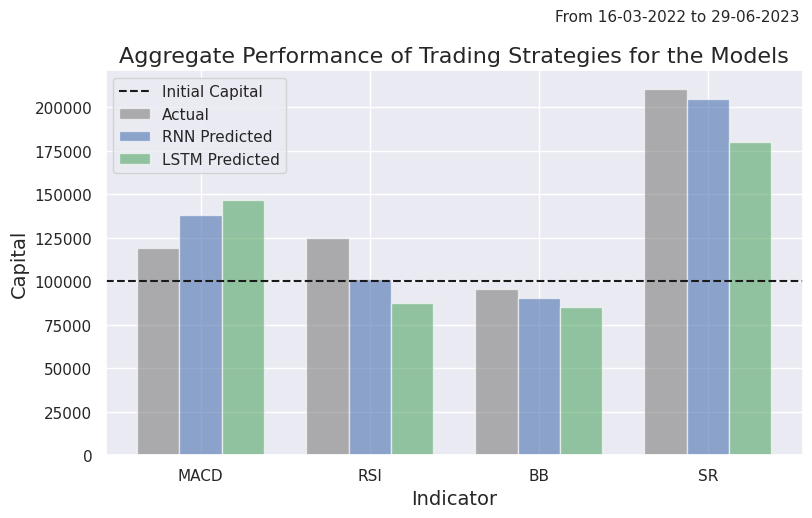

In [ ]:
display_indicator_comparison(indicators, capital_values_actual_lstm, capital_values_pred_rnn, capital_values_pred_lstm, initial_capital, start_date, end_date)

* **Volatility** measures the degree of variation of a trading price series over time, calculated as the standard deviation of returns. It quantifies how much the returns of the asset can deviate from their average over a specific period, providing a measure of risk.

* **Sharpe Ratio** evaluates an investment's risk-adjusted return by comparing its excess return (over the risk-free rate) to its volatility. For the RNN model, it's calculated by subtracting the risk-free rate (fixed at 1% in this case) from the RNN's mean daily return, dividing by the RNN's volatility, and then annualizing this ratio by multiplying by the square root of the number of trading days in a year (typically 252). A higher Sharpe Ratio indicates a more desirable risk-adjusted return.

* **Maximum Drawdown** is the maximum observed loss from a peak to a trough of an equity curve, before a new peak is attained. It is used as an indicator of downside risk over a specified time period.

In [ ]:
def plot_and_evaluate_equity_curves(df_actual_rnn, df_actual_lstm, risk_free_rate=0.01):
    # Number of trading days in a year
    trading_days = 252

    # Calculate the daily risk-free rate based on an annual risk-free rate
    daily_risk_free_rate = (1 + risk_free_rate)**(1/trading_days) - 1

    equity_curve_rnn = df_actual_rnn
    equity_curve_lstm = df_actual_lstm

    daily_returns_rnn = equity_curve_rnn.pct_change().dropna()
    daily_returns_lstm = equity_curve_lstm.pct_change().dropna()

    rnn_volatility = daily_returns_rnn.std()
    lstm_volatility = daily_returns_lstm.std()

    insights = []
    if lstm_volatility < rnn_volatility:
        insights.append(f'The LSTM model produces a smoother equity curve on actual capital (LSTM Volatility: {lstm_volatility:.8f} vs. RNN Volatility: {rnn_volatility:.8f}).')
    elif rnn_volatility < lstm_volatility:
        insights.append(f'The RNN model produces a smoother equity curve on actual capital (RNN Volatility: {rnn_volatility:.8f} vs. LSTM Volatility: {lstm_volatility:.8f}).')
    else:
        insights.append(f'Both the LSTM and RNN models exhibit equal volatility ({lstm_volatility:.8f}).')

    # Calculate Sharpe Ratio (annualized)
    sharpe_ratio_rnn = (daily_returns_rnn.mean() - daily_risk_free_rate) / rnn_volatility * np.sqrt(trading_days)
    sharpe_ratio_lstm = (daily_returns_lstm.mean() - daily_risk_free_rate) / lstm_volatility * np.sqrt(trading_days)

    insights.append(f'Sharpe Ratio: RNN={sharpe_ratio_rnn:.2f}, LSTM={sharpe_ratio_lstm:.2f}')

    max_drawdown_rnn = (equity_curve_rnn.cummax() - equity_curve_rnn) / equity_curve_rnn.cummax()
    max_drawdown_lstm = (equity_curve_lstm.cummax() - equity_curve_lstm) / equity_curve_lstm.cummax()

    insights.append(f'Additionally, the RNN model has a maximum drawdown of {max_drawdown_rnn.max():.2%} compared to LSTM\'s {max_drawdown_lstm.max():.2%}')

    plt.figure(figsize=(9, 5))
    plt.plot(equity_curve_rnn.index, equity_curve_rnn, label='RNN Equity Curve', lw=2, color='b')
    plt.plot(equity_curve_lstm.index, equity_curve_lstm, label='LSTM Equity Curve', lw=2, color='g')
    plt.title('Average Equity Curves for RNN vs LSTM')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Average Equity')
    plt.legend()
    plt.grid(True)
    plt.show()

    return insights

In [ ]:
# Initialize an empty DataFrame for the average capital
avg_capital_rnn = pd.DataFrame()

# Iterate over each item in the dictionary and join the 'Capital' columns
for key, df in acc_capital_pred_rnn.items():
    avg_capital_rnn = avg_capital_rnn.join(df['Capital'], how='outer', rsuffix=f'_{key}') if not avg_capital_rnn.empty else df['Capital'].to_frame(name=f'Capital_{key}')

# Calculate the row-wise mean for the average capital
avg_capital_rnn['Average_Capital'] = avg_capital_rnn.mean(axis=1)

avg_capital_rnn['Average_Capital']

Date
2022-03-16 04:00:00+00:00    100000.000000
2022-03-17 04:00:00+00:00    100000.000000
2022-03-18 04:00:00+00:00    100000.000000
2022-03-21 04:00:00+00:00    100000.000000
2022-03-22 04:00:00+00:00    100000.000000
                                 ...      
2023-06-23 04:00:00+00:00    133511.801423
2023-06-26 04:00:00+00:00    133575.996339
2023-06-27 04:00:00+00:00    133568.260693
2023-06-28 04:00:00+00:00    133544.499068
2023-06-29 04:00:00+00:00    133528.787911
Name: Average_Capital, Length: 324, dtype: float64

In [ ]:
# Initialize an empty DataFrame for the average capital
avg_capital_lstm = pd.DataFrame()

# Iterate over each item in the dictionary and join the 'Capital' columns
for key, df in acc_capital_pred_lstm.items():
    avg_capital_lstm = avg_capital_lstm.join(df['Capital'], how='outer', rsuffix=f'_{key}') if not avg_capital_lstm.empty else df['Capital'].to_frame(name=f'Capital_{key}')

# Calculate the row-wise mean for the average capital
avg_capital_lstm['Average_Capital'] = avg_capital_lstm.mean(axis=1)

avg_capital_lstm['Average_Capital']

Date
2022-03-16 04:00:00+00:00    100000.000000
2022-03-17 04:00:00+00:00    100000.000000
2022-03-18 04:00:00+00:00    100000.000000
2022-03-21 04:00:00+00:00    100039.524047
2022-03-22 04:00:00+00:00    100123.381139
                                 ...      
2023-06-23 04:00:00+00:00    124287.583732
2023-06-26 04:00:00+00:00    124467.498478
2023-06-27 04:00:00+00:00    124596.744074
2023-06-28 04:00:00+00:00    124687.449707
2023-06-29 04:00:00+00:00    124761.638212
Name: Average_Capital, Length: 324, dtype: float64

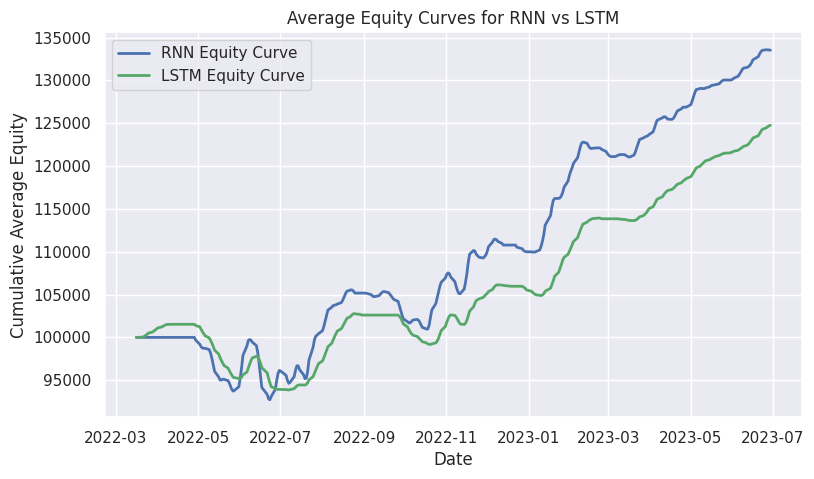

The LSTM model produces a smoother equity curve on actual capital (LSTM Volatility: 0.00217648 vs. RNN Volatility: 0.00399711).
Sharpe Ratio: RNN=3.43, LSTM=4.73
Additionally, the RNN model has a maximum drawdown of 7.28% compared to LSTM's 7.55%


In [ ]:
# Perform the plot and evaluation
insights  = plot_and_evaluate_equity_curves(avg_capital_rnn['Average_Capital'], avg_capital_lstm['Average_Capital'])
print('\n'.join(insights))